# **Perceptron Tricks and How to Train a Perceptron**

## **IMPORTING REQUIRED LIBRARIES**

In [1]:
# ENABLING INTERACTIVE NOTEBOOK PLOTTING FOR ANIMATIONS
%matplotlib ipympl 
import matplotlib.pyplot as plt             
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

import numpy as np                          

# IMPORTING SKLEARN FOR GENERATING SYNTHETIC CLASSIFICATION DATASET
from sklearn.datasets import make_classification  

## **GENERATING SYNTHETIC CLASSIFICATION DATASET**

In [2]:
X, y = make_classification(
    n_samples=100,          # CREATING 100 DATA POINTS FOR THE DATASET
    n_features=2,           # GENERATING 2 FEATURES (X AND Y COORDINATES)
    n_informative=1,        # ONLY 1 FEATURE CONTAINS USEFUL INFORMATION FOR CLASSIFICATION
    n_redundant=0,          # NO REDUNDANT FEATURES (LINEAR COMBINATIONS OF INFORMATIVE FEATURES)
    n_classes=2,            # CREATING A BINARY CLASSIFICATION PROBLEM (TWO CLASSES)
    n_clusters_per_class=1, # EACH CLASS FORMS ONE CLUSTER
    random_state=41,        # SETTING RANDOM SEED FOR REPRODUCIBLE RESULTS
    hypercube=False,        # NOT CONSTRAINING FEATURES TO A HYPERCUBE
    class_sep=10            # LARGE SEPARATION BETWEEN CLASSES FOR EASIER CLASSIFICATION
)

## **VISUALIZING THE GENERATED DATASET**

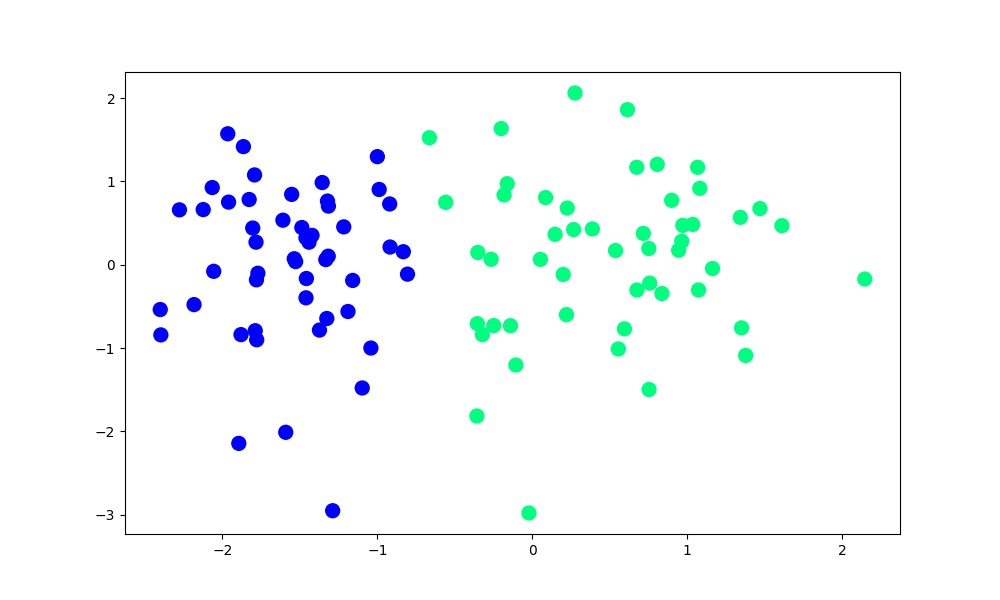

In [3]:
plt.figure(figsize=(10, 6))

plt.scatter(
    X[:, 0],      # X-AXIS: FIRST FEATURE (FIRST COLUMN) OF ALL DATA POINTS
    X[:, 1],      # Y-AXIS: SECOND FEATURE (SECOND COLUMN) OF ALL DATA POINTS
    c=y,          # COLOR MAPPING BASED ON CLASS LABELS (0 OR 1)
    cmap='winter', # USING 'WINTER' COLORMAP (BLUE TO GREEN COLOR SCHEME)
    s=100         # SETTING MARKER SIZE TO 100 FOR BETTER VISIBILITY
)

## **DEFINING THE STEP ACTIVATION FUNCTION**

In [4]:
# RETURNS 1 IF INPUT IS POSITIVE, OTHERWISE RETURNS 0 (HEAVISIDE STEP FUNCTION)

def step(z):
    return 1 if z > 0 else 0  

## **IMPLEMENTING THE PERCEPTRON LEARNING ALGORITHM**

In [5]:
def perceptron(X, y):
    # ADDING BIAS COLUMN (ALL ONES) AS FIRST COLUMN TO FEATURE MATRIX
    X = np.insert(X, 0, 1, axis=1)    

    
    # INITIALIZING ALL WEIGHTS TO 1 (INCLUDING BIAS WEIGHT)
    weights = np.ones(X.shape[1])     
    # SETTING LEARNING RATE TO 0.1 FOR WEIGHT UPDATES
    lr = 0.1                          



    # TRAINING FOR 1000 ITERATIONS (EPOCHS)
    for i in range(1000):             
    
        # RANDOMLY SELECTING A DATA POINT INDEX (STOCHASTIC APPROACH)
        j = np.random.randint(0, 100) 
        
        # COMPUTING PREDICTION USING STEP FUNCTION ON WEIGHTED SUM
        y_hat = step(np.dot(X[j], weights))  
        
        # UPDATING WEIGHTS USING PERCEPTRON LEARNING RULE
        weights = weights + lr*(y[j]-y_hat)*X[j]  



    # RETURNING BIAS (INTERCEPT) AND FEATURE WEIGHTS SEPARATELY
    return weights[0], weights[1:]    

## **TRAINING THE PERCEPTRON ON OUR DATASET**

In [6]:
# CALLING PERCEPTRON FUNCTION TO GET TRAINED INTERCEPT AND COEFFICIENTS
intercept_, coef_ = perceptron(X, y)  

## **DISPLAYING THE LEARNED INTERCEPT (BIAS)**

In [7]:
# PRINTING THE LEARNED BIAS/INTERCEPT VALUE
print(intercept_)  

0.9


## **DISPLAYING THE LEARNED COEFFICIENTS (WEIGHTS)**

In [8]:
# PRINTING THE LEARNED FEATURE WEIGHTS (COEFFICIENTS) FOR BOTH FEATURES
print(coef_)  

[1.2460581  0.24462704]


## **CALCULATING DECISION BOUNDARY PARAMETERS**

In [9]:
# CALCULATING SLOPE OF DECISION BOUNDARY LINE (m = -w1/w2)
m = -(coef_[0]/coef_[1])  

# CALCULATING Y-INTERCEPT OF DECISION BOUNDARY LINE (b = -w0/w2)
b = -(intercept_/coef_[1])  

## **GENERATING POINTS FOR DECISION BOUNDARY LINE**

In [10]:
# CREATING 100 EVENLY SPACED X-VALUES FROM -3 TO 3
x_input = np.linspace(-3, 3, 100)  

# CALCULATING CORRESPONDING Y-VALUES USING LINEAR EQUATION y = mx + b
y_input = m*x_input + b  

## **VISUALIZING DATA WITH DECISION BOUNDARY**

(-3.0, 2.0)

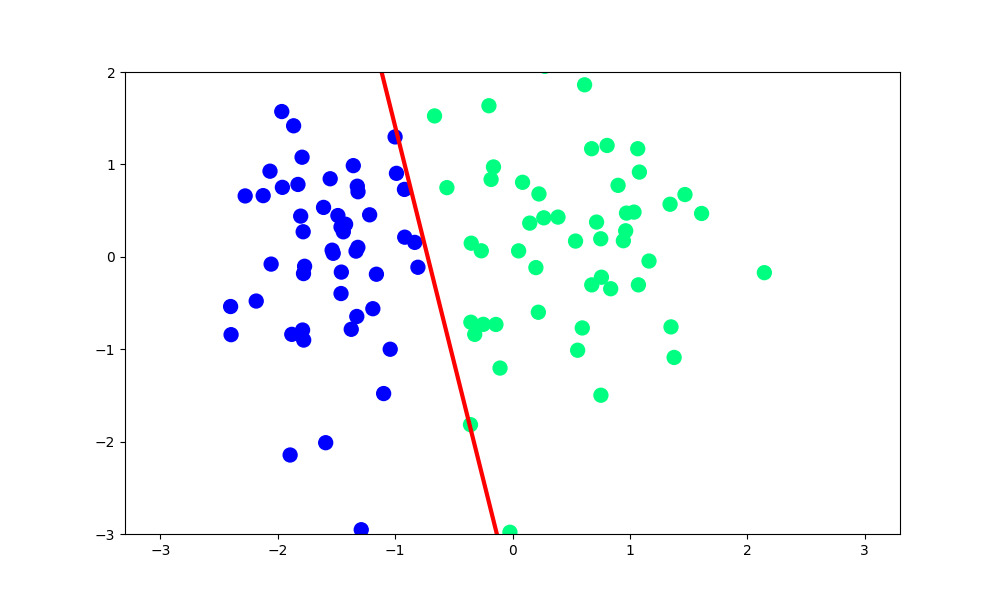

In [11]:
plt.figure(figsize=(10, 6))

plt.plot(
    x_input,        # X-COORDINATES FOR THE DECISION BOUNDARY LINE
    y_input,        # Y-COORDINATES FOR THE DECISION BOUNDARY LINE
    color='red',    # SETTING LINE COLOR TO RED FOR HIGH VISIBILITY
    linewidth=3     # SETTING LINE WIDTH TO 3 FOR BETTER VISIBILITY
)

plt.scatter(
    X[:, 0],        # X-AXIS: FIRST FEATURE OF ALL DATA POINTS
    X[:, 1],        # Y-AXIS: SECOND FEATURE OF ALL DATA POINTS
    c=y,            # COLOR MAPPING BASED ON CLASS LABELS (0 OR 1)
    cmap='winter',  # USING 'WINTER' COLORMAP FOR CONSISTENT VISUALIZATION
    s=100           # SETTING MARKER SIZE TO 100 FOR CLEAR VISIBILITY
)

plt.ylim(-3, 2)  # LIMITING Y-AXIS RANGE FROM -3 TO 2 FOR BETTER VIEW

---
---

## **ANIMATED PERCEPTRON LEARNING - TRACKING DECISION BOUNDARY EVOLUTION**

In [12]:
def perceptron(X, y):
    # LIST TO STORE SLOPE VALUES FOR EACH ITERATION
    m = []  
    # LIST TO STORE Y-INTERCEPT VALUES FOR EACH ITERATION
    b = []  


    # ADDING BIAS COLUMN (ALL ONES) TO FEATURE MATRIX
    X = np.insert(X, 0, 1, axis=1)  


    # INITIALIZING ALL WEIGHTS TO 1 (INCLUDING BIAS WEIGHT)
    weights = np.ones(X.shape[1])  
    # SETTING LEARNING RATE TO 0.1 FOR WEIGHT UPDATES
    lr = 0.1  

    
    
    # TRAINING FOR 200 ITERATIONS TO CAPTURE LEARNING PROCESS
    for i in range(200):  
        # RANDOMLY SELECTING A DATA POINT INDEX (STOCHASTIC APPROACH)
        j = np.random.randint(0, 100)  
        
        # COMPUTING PREDICTION USING STEP FUNCTION ON WEIGHTED SUM
        y_hat = step(np.dot(X[j], weights))  
        
        # UPDATING WEIGHTS USING PERCEPTRON LEARNING RULE
        weights = weights + lr*(y[j] - y_hat)*X[j]  
        
        
        # AVOIDING DIVISION BY ZERO ERROR WHEN CALCULATING SLOPE AND INTERCEPT
        if abs(weights[2]) > 1e-10:  # CHECK IF WEIGHT[2] IS NOT CLOSE TO ZERO
            m.append(-(weights[1] / weights[2]))  # SLOPE: -w1/w2
            b.append(-(weights[0] / weights[2]))  # Y-INTERCEPT: -w0/w2
        else:
            # IF WEIGHT[2] IS ZERO, USE PREVIOUS VALUES OR DEFAULT
            m.append(m[-1] if m else 0)  # USE LAST SLOPE OR 0
            b.append(b[-1] if b else 0)  # USE LAST INTERCEPT OR 0


    return m, b

## **TRAINING PERCEPTRON AND COLLECTING BOUNDARY PARAMETERS**

In [13]:
# GETTING LISTS OF SLOPE AND INTERCEPT VALUES FOR EACH TRAINING ITERATION
m, b = perceptron(X, y)  

## **CREATING THE PLOT SETUP FOR ANIMATION**

(-3.0, 3.0)

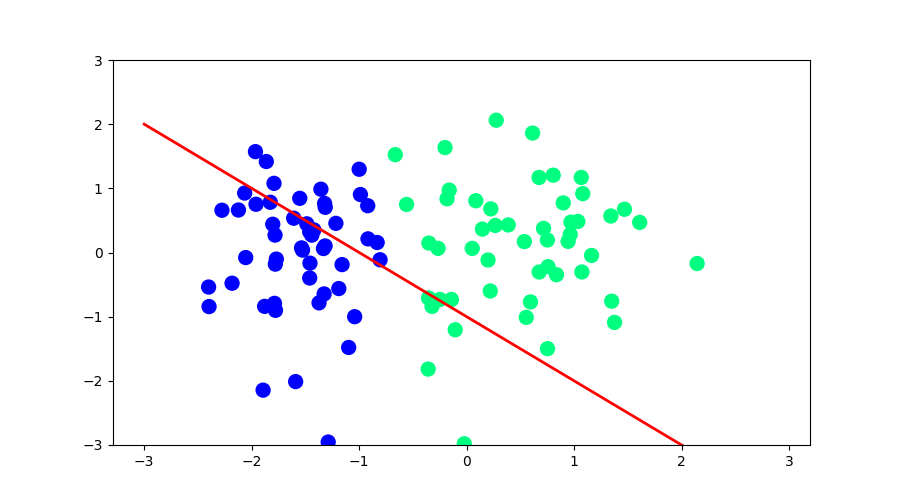

In [14]:
fig, ax = plt.subplots(figsize=(9, 5))

# CREATING X-VALUES FOR DECISION BOUNDARY LINE
x_i = np.arange(-3, 3, 0.1)  
# CALCULATING INITIAL Y-VALUES USING FIRST ITERATION PARAMETERS
y_i = x_i*m[0] + b[0]  

ax.scatter(
    X[:, 0],        # X-COORDINATES OF DATA POINTS
    X[:, 1],        # Y-COORDINATES OF DATA POINTS
    c=y,            # COLOR BASED ON CLASS LABELS
    cmap='winter',  # COLORMAP FOR VISUALIZATION
    s=100           # MARKER SIZE
)

line, = ax.plot(
    x_i,            # X-VALUES FOR THE LINE
    x_i*m[0]+b[0],  # INITIAL Y-VALUES FOR THE LINE
    '-r',           # RED SOLID LINE
    linewidth=2     # LINE WIDTH
)

plt.ylim(-3, 3)  # SETTING Y-AXIS LIMITS FOR BETTER VISUALIZATION

## **DEFINING THE ANIMATION UPDATE FUNCTION**

In [15]:
def update(i):
    # CREATING LABEL FOR CURRENT EPOCH
    label = 'epoch {0}'.format(i+1)  

    # UPDATING LINE WITH NEW SLOPE AND INTERCEPT
    line.set_ydata(x_i*m[i] + b[i])  

    # UPDATING X-AXIS LABEL WITH EPOCH INFO (FIXED FROM ax.set_label)
    ax.set_xlabel(f'X1 - {label}')   

    # RETURNING LINE OBJECT FOR ANIMATION
    return line,  

## **CREATING AND RUNNING THE ANIMATION**

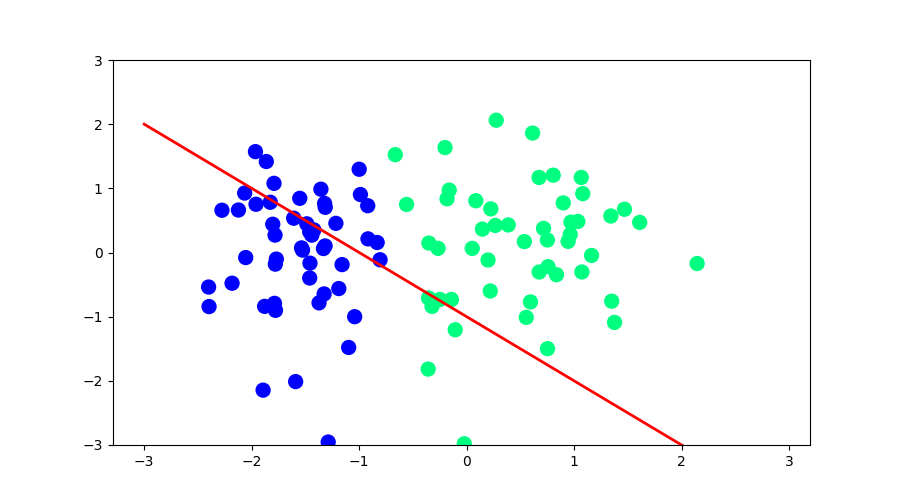

In [16]:
# CREATING THE ANIMATION OBJECT AND STORING IT IN A VARIABLE
anim = FuncAnimation(
    fig,          # FIGURE OBJECT TO ANIMATE
    update,       # UPDATE FUNCTION CALLED FOR EACH FRAME
    repeat=True,  # REPEAT ANIMATION CONTINUOUSLY
    frames=200,   # NUMBER OF FRAMES (MATCHES TRAINING ITERATIONS)
    interval=100, # TIME BETWEEN FRAMES IN MILLISECONDS
    blit=False    # DISABLE BLITTING FOR BETTER COMPATIBILITY
)

plt.show()

## **ALTERNATIVE**

In [17]:
from IPython.display import HTML, display

anim_html = FuncAnimation(
    fig,          # FIGURE OBJECT TO ANIMATE
    update,       # UPDATE FUNCTION CALLED FOR EACH FRAME
    repeat=True,  # REPEAT ANIMATION CONTINUOUSLY
    frames=200,   # NUMBER OF FRAMES (MATCHES TRAINING ITERATIONS)
    interval=100  # TIME BETWEEN FRAMES IN MILLISECONDS
)

display(HTML(anim_html.to_jshtml()))